# This notebook must be run with the Vizgen_2 conda environment within the Vizgen.sif singularity container

In [1]:
import scanpy as sc
import loompy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import anndata
import seaborn as sns

In [2]:
base_path = '/hpc/projects/group.quake/doug/Shapes_Spatial/'
metas = [
    '24-mo-female-1/',
    '24-mo-female-3/',
    '24-mo-female-5/',
    '24-mo-male-1/',
    '24-mo-male-2/',
    '24-mo-male-4-rev2/',
    '3-mo-male-1/',
    '3-mo-male-2/',
    '3-mo-male-3-rev2/',
    '3-mo-female-1-rev2/',
    '3-mo-female-2/',
    '3-mo-female-3/'
]
adatas = []

for meta in metas:
    file_path = os.path.join(base_path, meta, 'baysor')
    loom_files = [f for f in os.listdir(file_path) if f.endswith('.loom') and '6-5' in f]
    if loom_files:
        loom_file = loom_files[0]  # Assuming there is only one .loom file (If you only ran one parameter of baysor)
        adata = sc.read_loom(os.path.join(file_path, loom_file))
        adata.obs['Age'] = meta.split('-')[0]
        adata.obs['Sex'] = meta.split('-')[2]
        adata.obs['batchID'] = meta.split('/')[0]
        adata.var_names = adata.var.Name
        adata.obsm['spatial'] = adata.obs[["x", "y"]].values
        adatas.append(adata)

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/alig

In [3]:
combined_adata = anndata.concat(adatas, axis=0)

gene_counts_per_cell = combined_adata.X.getnnz(axis=1)

# Optionally, add this as a new column in `adata.obs`
combined_adata.obs['gene_counts'] = gene_counts_per_cell

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


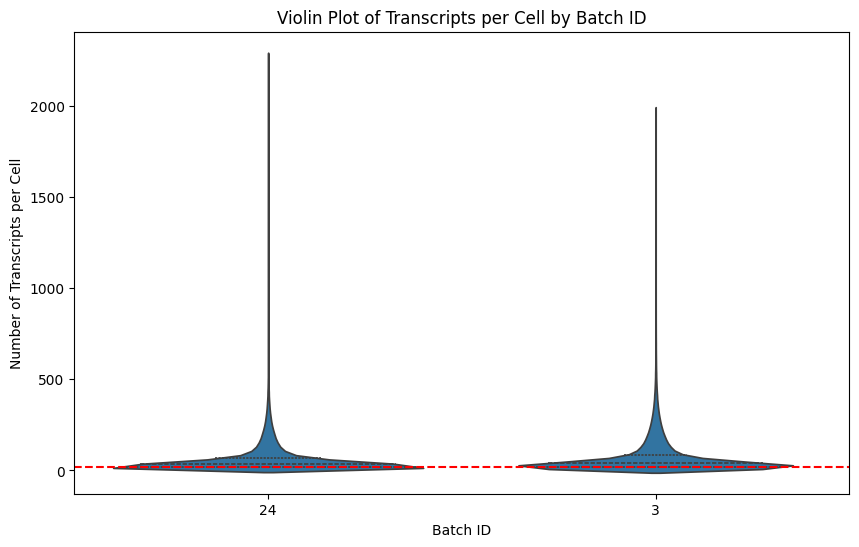

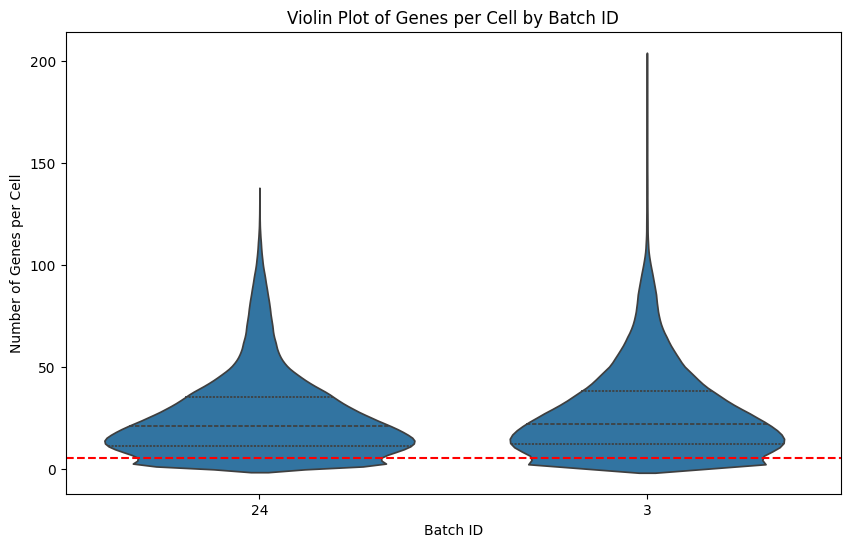

In [4]:
plt.figure(figsize=(10, 6))
sns.violinplot(data=combined_adata.obs, x='Age', y='n_transcripts', inner="quartile")

# Step 3: Add a horizontal line at 20
plt.axhline(y=20, color='red', linestyle='--')

# Step 4: Label the plot
plt.xlabel("Batch ID")
plt.ylabel("Number of Transcripts per Cell")
plt.title("Violin Plot of Transcripts per Cell by Batch ID")

plt.savefig('transcripts_per_cell_age.pdf',format='pdf')
plt.show()

plt.figure(figsize=(10, 6))
sns.violinplot(data=combined_adata.obs, x='Age', y='gene_counts', inner="quartile")

# Step 3: Add a horizontal line at 20
plt.axhline(y=5, color='red', linestyle='--')

# Step 4: Label the plot
plt.xlabel("Batch ID")
plt.ylabel("Number of Genes per Cell")
plt.title("Violin Plot of Genes per Cell by Batch ID")
plt.savefig('genes_per_cell_age.pdf',format='pdf')
plt.show()

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


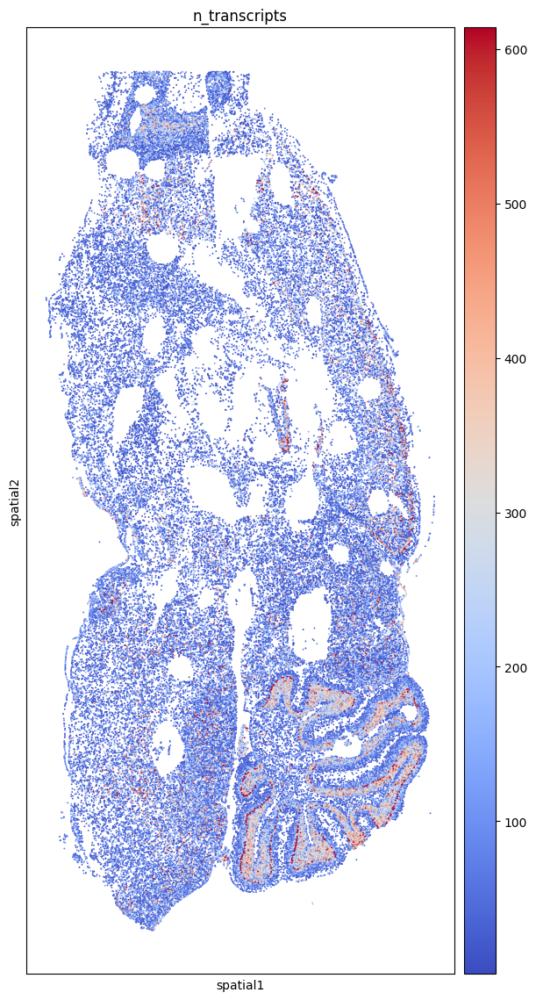

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


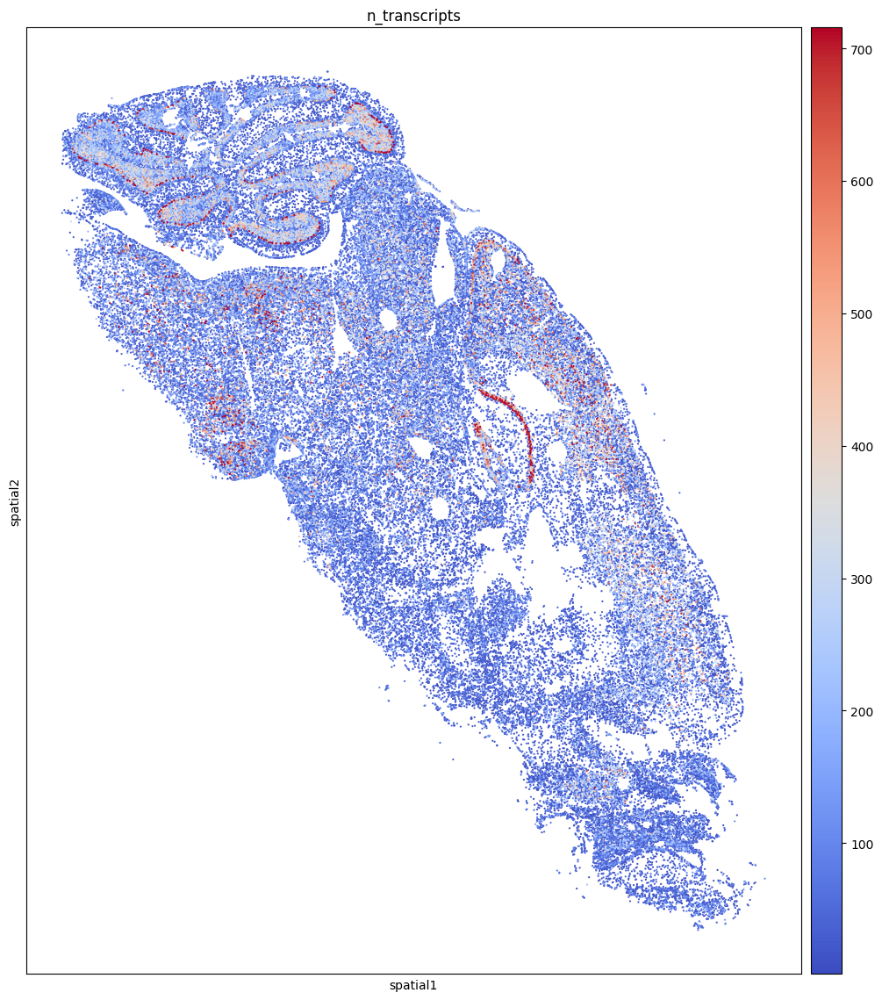

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


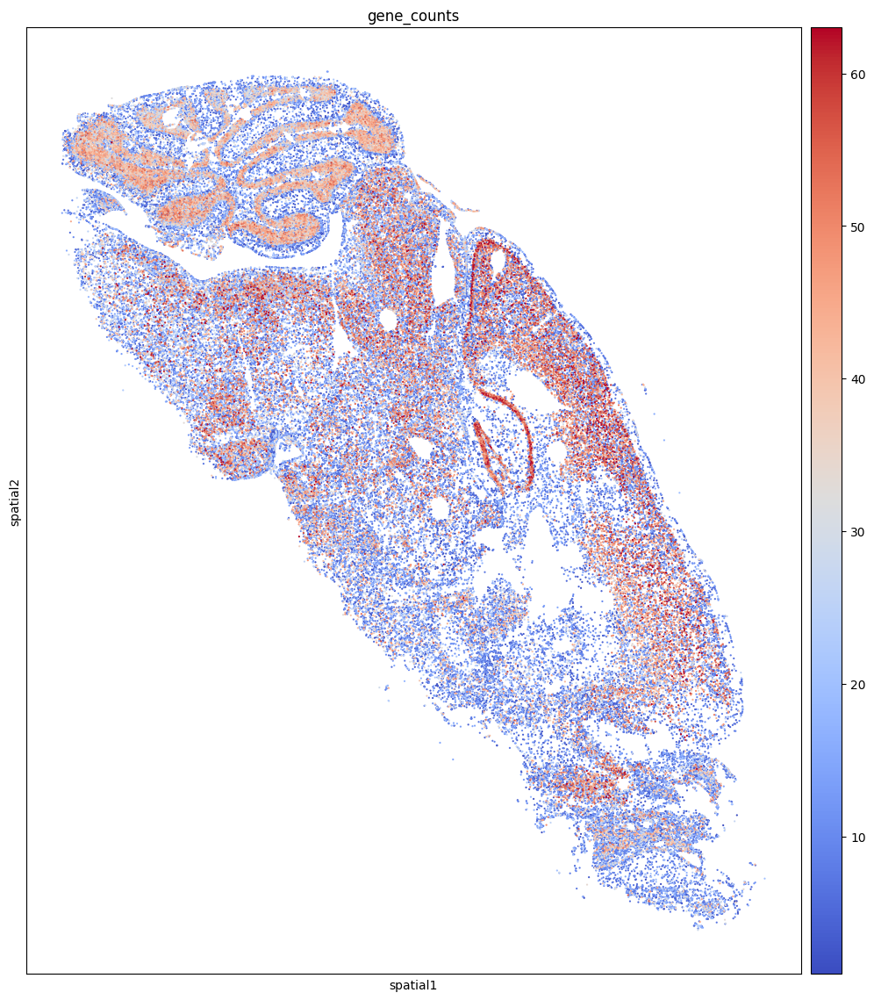

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


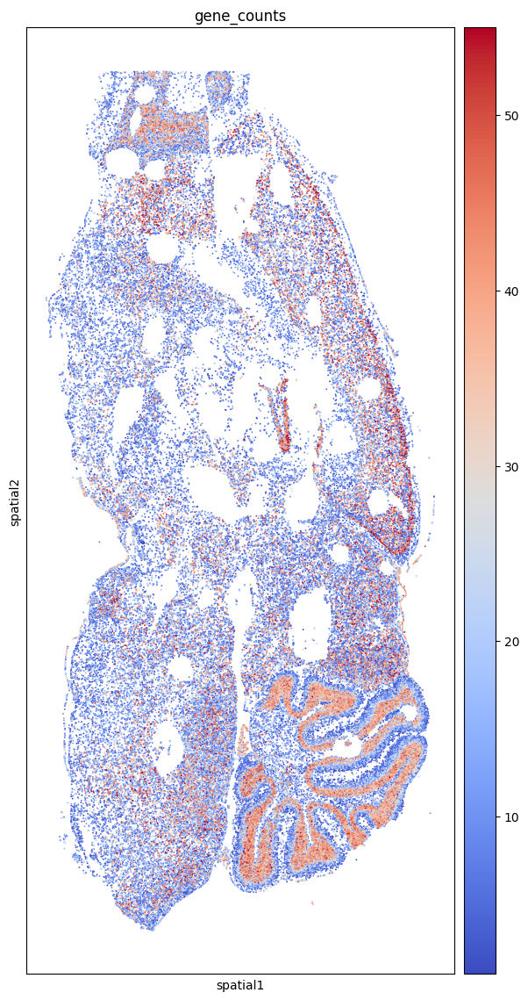

In [5]:
fig, ax = plt.subplots(figsize=(14,14))
sc.pl.spatial(combined_adata[combined_adata.obs.batchID == '24-mo-male-4-rev2'],cmap='coolwarm',color='n_transcripts',spot_size=25,ax=ax,vmax = "p99.5")
fig.savefig('old_n_transcripts.png', dpi=300, bbox_inches='tight')

fig, ax = plt.subplots(figsize=(14,14))
sc.pl.spatial(combined_adata[combined_adata.obs.batchID == '3-mo-female-1-rev2'],cmap='coolwarm',color='n_transcripts',spot_size=25,ax=ax,vmax = "p99.5")
fig.savefig('young_n_transcripts.png', dpi=300, bbox_inches='tight')

fig, ax = plt.subplots(figsize=(14,14))
sc.pl.spatial(combined_adata[combined_adata.obs.batchID == '3-mo-female-1-rev2'],color='gene_counts',spot_size=25,ax=ax,cmap='coolwarm',vmax = "p99.5")
fig.savefig('young_n_genes.png', dpi=300, bbox_inches='tight')

fig, ax = plt.subplots(figsize=(14,14))
sc.pl.spatial(combined_adata[combined_adata.obs.batchID == '24-mo-male-4-rev2'],cmap='coolwarm',color='gene_counts',spot_size=25,ax=ax,vmax = "p99.5")
fig.savefig('old_n_genes.png', dpi=300, bbox_inches='tight')

/home/doug.henze/.conda/envs/Vizgen_2/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


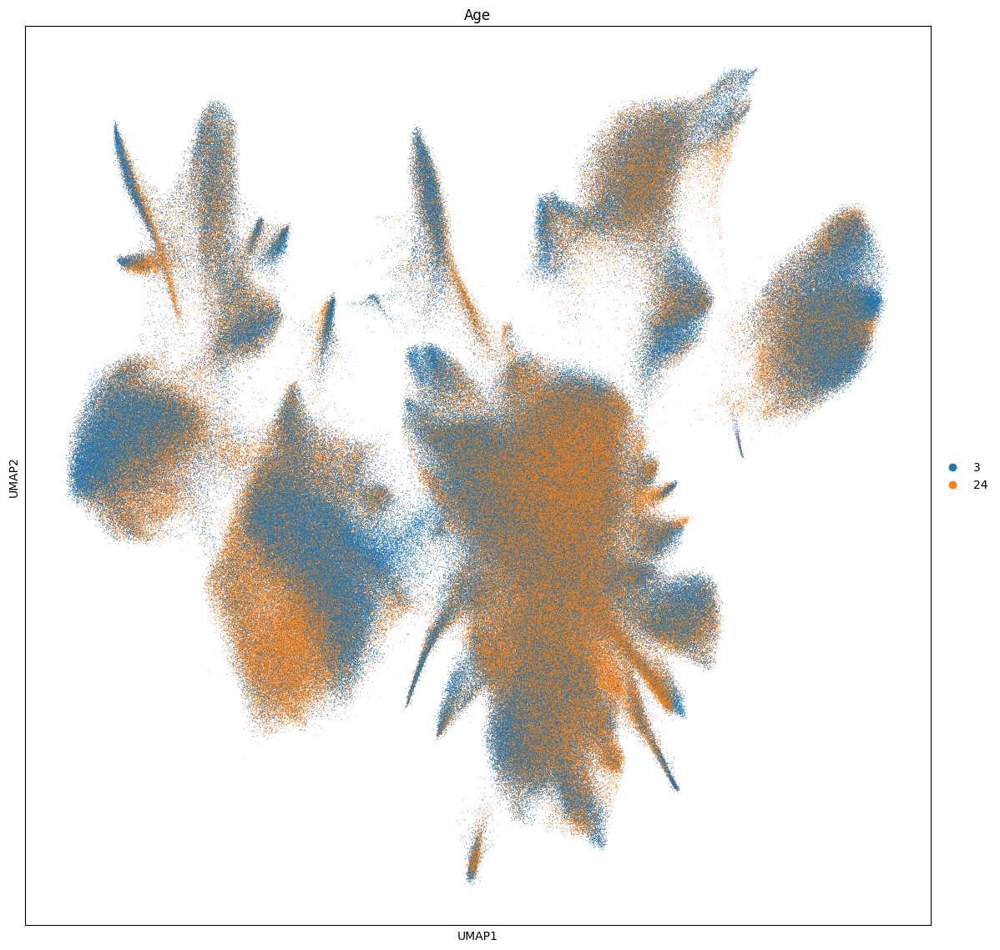

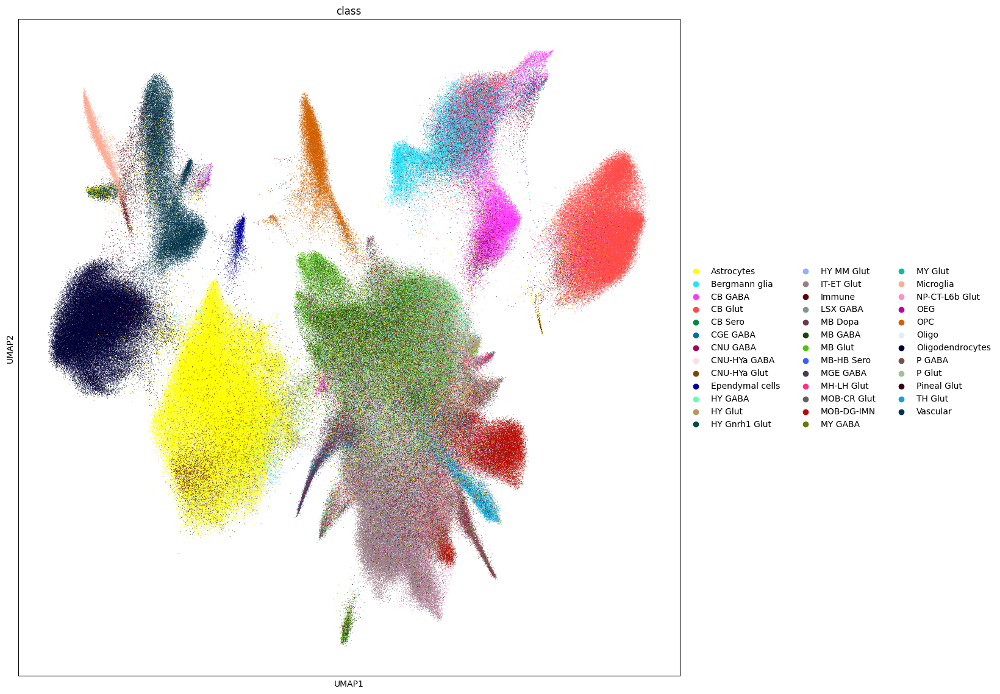

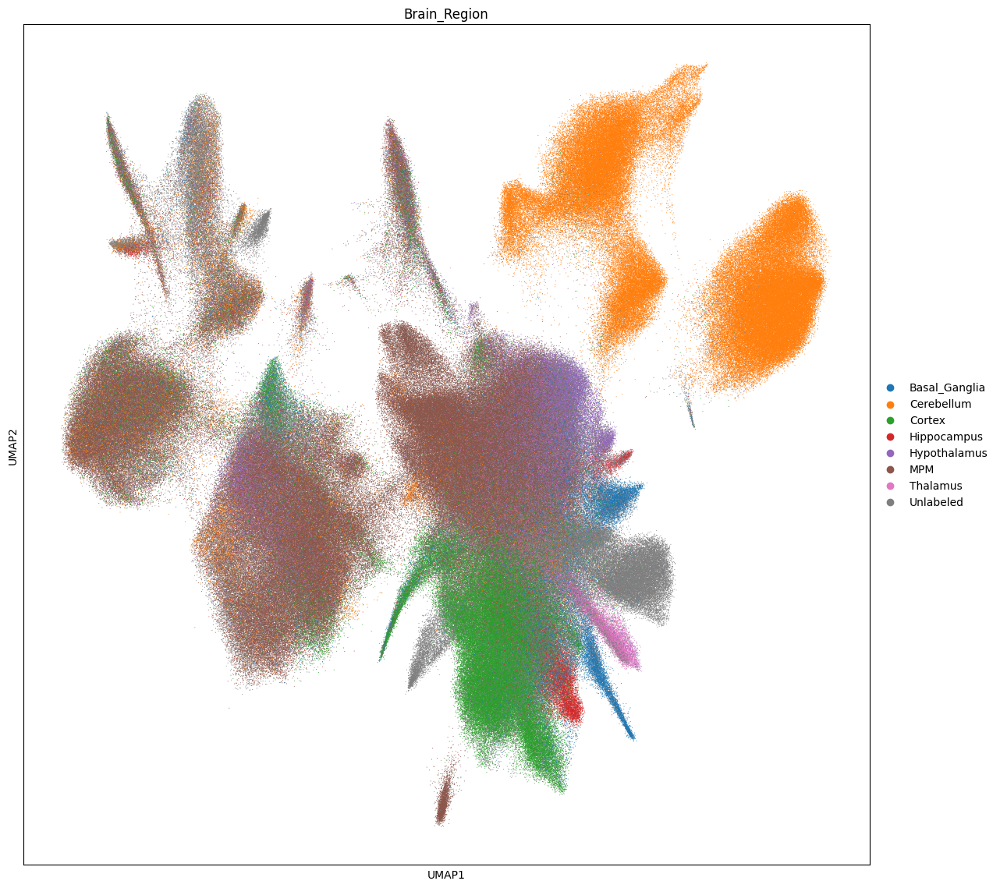

In [6]:
adata = sc.read_h5ad('../02_annotation/ABC_cleaned.h5ad')

adata.X = adata.layers['counts'].copy()
gene_counts_per_cell = adata.X.getnnz(axis=1)
adata.obs['gene_counts'] = gene_counts_per_cell
adata = adata[adata.obs['gene_counts'] > 5]

fig, ax = plt.subplots(figsize=(14,14))
sc.pl.umap(adata,color='Age',size=2,ax=ax)
fig.savefig('age_whole_umap_high_res.png', dpi=300, bbox_inches='tight')

fig, ax = plt.subplots(figsize=(14,14))
sc.pl.umap(adata,color='class',size=2,ax=ax)
fig.savefig('class_whole_umap_high_res.png', dpi=300, bbox_inches='tight')

fig, ax = plt.subplots(figsize=(14,14))
sc.pl.umap(adata,color='Brain_Region',size=2,ax=ax)
fig.savefig('region_whole_umap_high_res.png', dpi=300, bbox_inches='tight')